# **Семинар 14.** Что наша жизнь? Игра!

На семинаре по `Style Transfer` мы познакомились с таким как подходом как `Perceptual Loss` -  использование уже обученной нейросети для оценки работы другой - `Transformation Net` - в задаче переноса стиля. При этом на основании выходов сети-эксперта обучалась первая сетка, а сеть-эксперт оставалась неизменной. 

Отсюда один шаг до моделей `GAN` - состязательных сетей, когда обе сети учатся благодаря друг другу - одна пытается "обмануть", а другая "разгадать" обман. 

## **14.1** Что можно делать с помощью GAN моделей?

Генерацию иображений. 

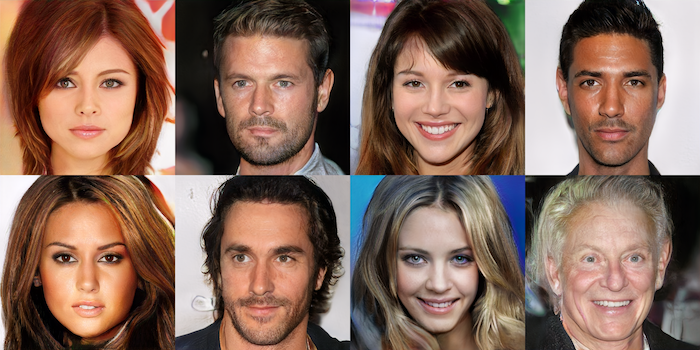

[Условную генерацию.](https://affinelayer.com/pixsrv/) 

И ещё [такую](https://make.girls.moe/#/). 

[Adversarial атаки](https://towardsdatascience.com/breaking-neural-networks-with-adversarial-attacks-f4290a9a45aa) на другие сети (`white-box` и [`black-box`](https://arxiv.org/pdf/1602.02697.pdf)).

C помощью невидимого глазу [шума](https://arxiv.org/pdf/1412.6572.pdf):

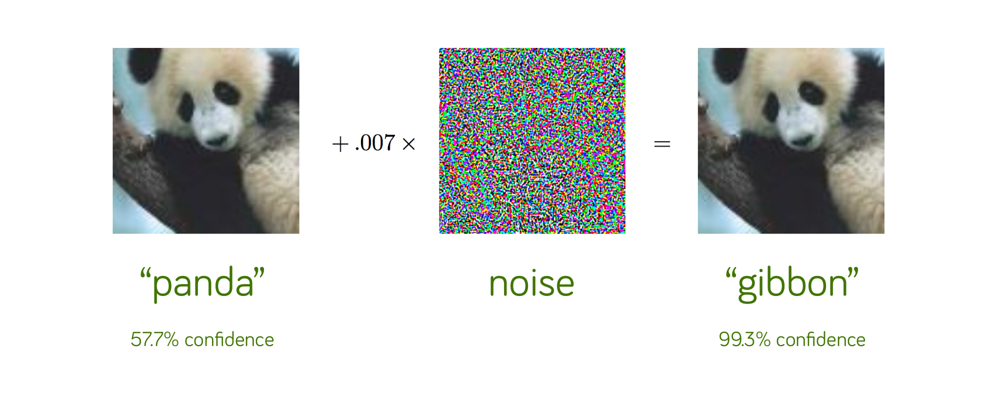

С помощью [патчей](https://arxiv.org/pdf/1712.09665.pdf): 

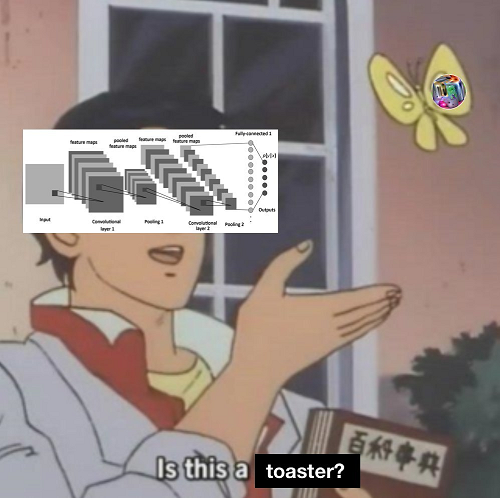

Смена домена image-to-image: 

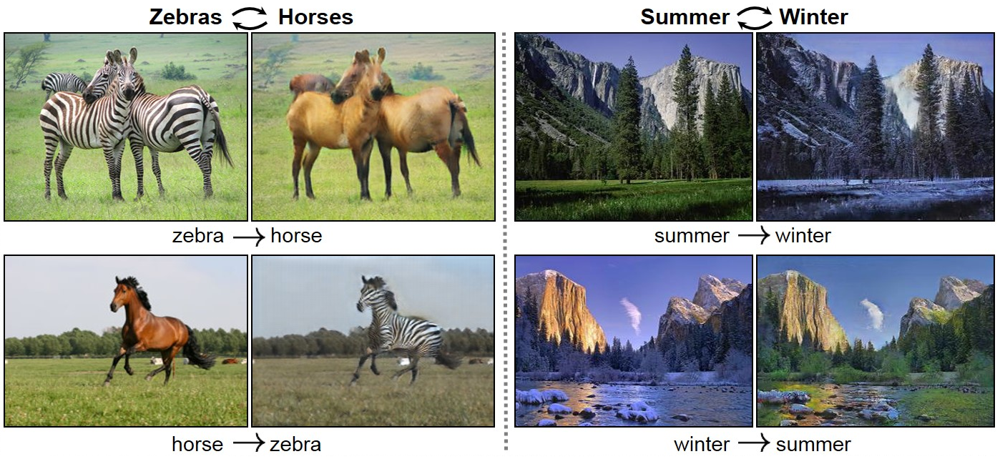

И кучу всякого другого, стоит только погуглить.
Большой репозиторий с GANами на `pytorch` смотреть [тут](https://github.com/eriklindernoren/PyTorch-GAN).  

## **14.2** Ванильный GAN

**Что такое GAN?**

Всё началось в статье [Goodfellow et al](https://papers.nips.cc/paper/2014/file/5ca3e9b122f61f8f06494c97b1afccf3-Paper.pdf) в далеком 2014 году.

Вообще говоря, `GAN` - это не какая то фиксированная архитектура, а особый подход к обучению сетей - на базе механизма состязания. Любая `GAN` модель состоит из двух моделей, которые борются друг с другом - **генератора** и **дискриминатора**.

В базовом варианте генератор должен генерировать фальшивое изображение, которое, как он считает, похоже на то, что генератор видел в обучающей выборке. Дискриминатор же должен уметь сказать настоящая она или порождена фантазией генератора (выдает число от 0 до 1 - вероятность настоящести, то есть это просто бинарный классификатор).

**Что идейно происходит при обучении**: 

Генератор учится делать всё более и более классные фальшивки, чтобы дискриминатор как можно больше ошибался, а дискриминатор учится лучше отличать фейки от реальных изображений. Это игра, и равновесие в ней (а на самом деле победа генератора) достигается в том случае, если генератор создает идеальные неотличимые от обучающей выборки картинки, а дискриминатору остается только "бросать монетку" и пытаться случайно угадать real/fake он видит.


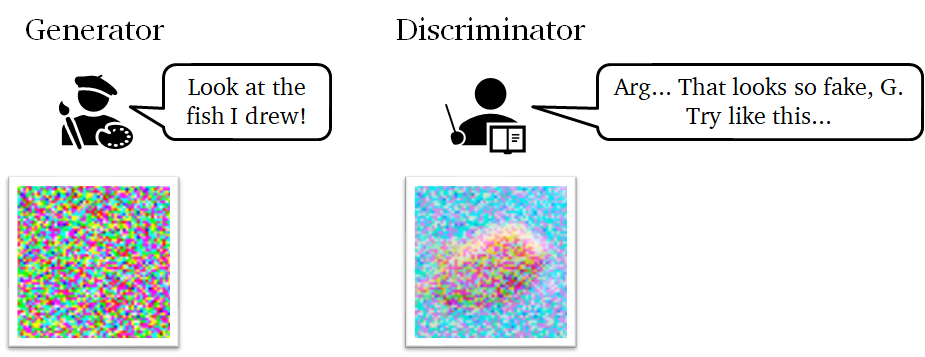

**Теперь немножко формул и подробностей.** 

Пусть $x$ - изображение `3x64x64`, $D(x)$ - вероятность, с которой дискриминатор готов отнести $x$ к реальным данным из train, а не к порожденным генератором.   

Зададим также $z$ - скрытый вектор, полученный из нормального распределения (шум). $G(z)$ - нарисованное генератором изображение (примерно из домена обучающих картинок) при таком входном шуме. Чтобы генерить картинки из нужного распределения (реальных обучающих картинок), $G$ надо оценить распределение обучаюших данных - $p_{data}$, тогда он будет генерировать картинки из своей оценки распределения - $p_G$.



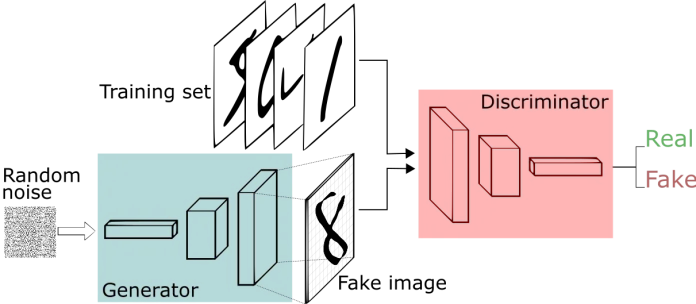

Итак, $D(G(z))$ - вероятность того, что выход генератора реален. $D$ и $G$ играют в minimax игру, где $D$ старается максимизировать вероятность своей верной классификации реальных и фейковых картинок: $\log D(x) + \log(1−D(G(z))$, а $G$ старается минимизировать вероятность того, что $D$ будет его выходы опознавать как фейки, то есть минимизировать $\log(1 - D(G(x)))$.


Тогда по первоначальной статье value function GANа выглядит так:

$$ \min_G \max_DV(D,G)=E_{x∼p_{data}(x)}[\log D(x)]+E_{z∼p_z(z)}[\log(1−D(G(z)))]$$

`Loss` же в таких терминах это $L=-V(D, G)$.

Теоретическое решение достигается при $p_g = p_{data}$, и это мы и обсудили выше, на практике же всё не обязательно так происходит.
В статье также приводятся такие графики для пояснения прихода в равновесную точку:

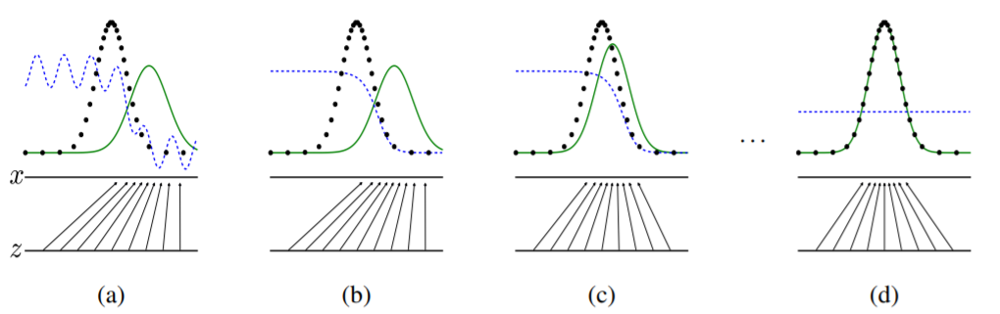

## **14.3** Посмотрим код

Посмотрим на простой понятный нам `GAN` - `DCGAN`, описанный [туть](https://arxiv.org/pdf/1511.06434.pdf). 

**Дискриминатор** тут состоит из `strided convs`, `batchnorms`, `LeakyReLUs`. Его вход - картинки `3x64x64`, выход - одно число.

**Генератор** же из `deconvs` `(transposed convs)`, `batchnorms`, `LeakyReLUs`. Его вход - вектор шума $z$, выход - `3x64x64` картинка.

In [1]:
import os
import random
import argparse

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import HTML

manualSeed = 24
random.seed(manualSeed)
torch.manual_seed(manualSeed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
%matplotlib inline

Данные возьмем довольно стандартные - [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). Можно брать [тут](https://drive.google.com/file/d/1JJ2hM74m-O6sM5Dkge1oTwSE-y82sNF1/view?usp=share_link). 

In [2]:
#from google.colab import drive
#drive.mount("/content/drive")
#!unzip -q "/content/drive/MyDrive/Colab Notebooks/OM 2021/14. GAN/img_align_celeba.zip" -d "celeba"

!unzip -q "img_align_celeba.zip" -d "celeba"


In [3]:
image_size = 64
transform=transforms.Compose([ transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = datasets.ImageFolder(root='./celeba',  transform=transform)

In [4]:
batch_size = 128
num_epochs = 2
lr = 0.0002
beta1 = 0.5 #for Adam

image_size = 64
nc = 3
nz = 100 # размерность шумового вектора, который будет есть генератор

ngf = 64 # внутренняя размерность фичамап в генераторе
ndf = 48 # аналогично для дискриминатора

In [5]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

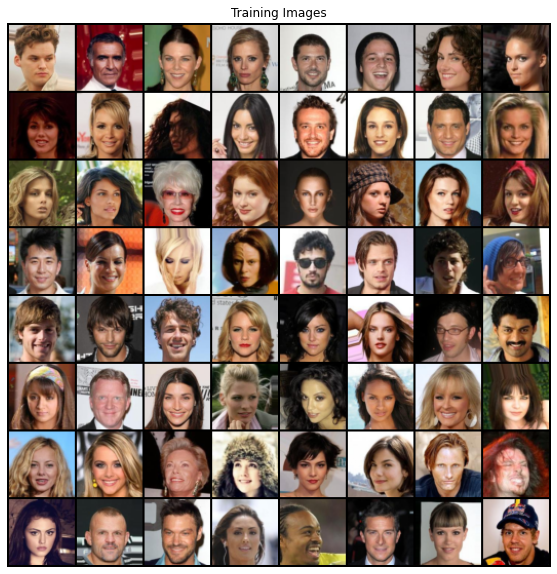

In [6]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))

Инициализация весов. Тут делаем просто как авторы `DCGAN` сказали - инициализируем из нормального распределения.

In [7]:
#берем на вход инициализированную модель и у нее меняем веса
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

**Генератор.**

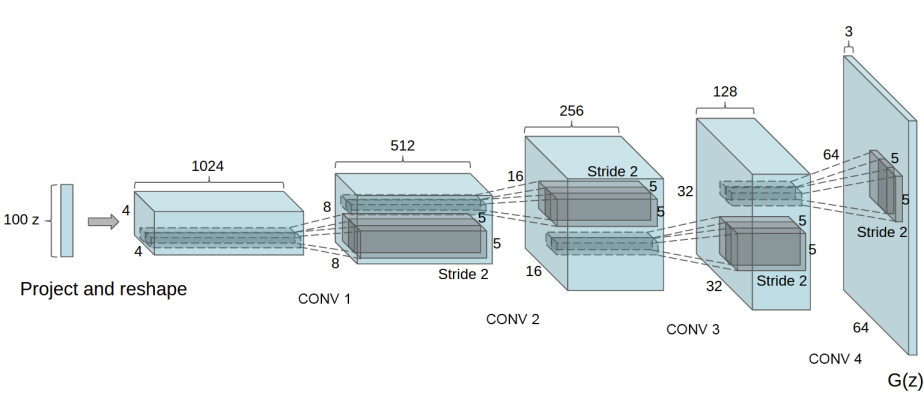

In [8]:
class Generator(nn.Module):
    def __init__(self, nz, ngf):
        super(Generator, self).__init__()

        self.layers = nn.Sequential(
            # deconv on z 
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False), # (ngf*8) x 4 x 4
            nn.BatchNorm2d(ngf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False), #(ngf*4) x 8 x 8
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False), # (ngf*2) x 16 x 16
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False), # (ngf) x 32 x 32
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False), # 3 x 64 x 64
            nn.Tanh()
        )

    def forward(self, input):
        return self.layers(input)

In [9]:
netG = Generator(nz, ngf).to(device)

In [10]:
netG.apply(weights_init)

Generator(
  (layers): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTra

**Дискриминатор.**

In [11]:
class Discriminator(nn.Module):
    def __init__(self, ndf):
        super(Discriminator, self).__init__()

        self.layers = nn.Sequential(
            # input  3 x 64 x 64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),  # (ndf) x 32 x 32
            nn.LeakyReLU(0.2, inplace=True),
           
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False), # (ndf*2) x 16 x 16
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False), # (ndf*4) x 8 x 8
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False), # (ndf*8) x 4 x 4
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False), # 1
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.layers(input)

In [12]:
netD = Discriminator(ndf).to(device)
netD.apply(weights_init)

Discriminator(
  (layers): Sequential(
    (0): Conv2d(3, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(48, 96, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(96, 192, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(192, 384, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(384, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

**Loss.** 

Используем бинарную кросс-энтропию - [BCE Loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss), в торче для батча размера N она реализована так:

$$ l(x,y)=L={l_1,…,l_N}^⊤, $$
$$l_n = −[y_n⋅\log x_n+(1−y_n)⋅\log(1−x_n)]$$

Тут у нас как всегда в торче уже включены логарифмы. В зависимости от $y$ (1 - лейбл реальных данных, 0 - фейков от генератора) будет использоваться одна или другая часть лосса (как мы подним одна работает на генератор, другая на дискриминатор).

In [13]:
criterion = nn.BCELoss()

#на этом батче из шумов будем отслеживать процесс улучшения генератора
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1.
fake_label = 0.

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

**Обучение.**

Тренировать GAN модели надо аккуратно. Тут процедура близка к тому, что было описано в первоначальной статье, а также накручены некоторые трюки [отсюда](https://github.com/soumith/ganhacks).

Будем собирать наше обучение из двух шагов - учим отдельно дискриминатор и генератор. А минибатчи будем собирать отдельно из настоящих и фейковых картинок.

**1) Шаг дискриминатора**

Вспомним чего хочет дискриминатор - максимизировать свою вероятность правильного распознавания реальных картинок и фейков - те $\max_{D} \log(D(x))+\log(1−D(G(z)))$. Так как минибатчи либо целиком фейк, либо целиком реальные, максимизация будет в два шага проходить:
 - собираем реальный батч, прогоняем через $D$, считаем $\log(D(x))$, делаем backward,
 - собираем фейковый батч, прогоняем через $D$, считаем $\log(1−D(G(z)))$, делаем backward.
 - теперь когда мы собрали все градиенты, делаем шаг оптимайзера, т.е. обновляем веса дискриминатора

**2) Шаг генератора**

Как мы помним, в свою очередь генератор хочет минимизировать $\log(1−D(G(z)))$ - генерить такие классные картинки, что дискриминатор будет на них ошибаться. Такая минимизация эквивалентна максимизации $\log(D(G(z)))$ 

Как тут будем делать: ещё раз прогоним через обновленный $D$ фейки $G(z)$ с первого шага но будем использовать для их обозначения **реальные лейблы**, подадим их в loss фукнцию и на основании неё прогоним градиенты через $G$ и обновим её веса. 

Почему мы теперь будем при подсчете лосса использовать 1-ки для фейков?
Таким образом мы занулим первую часть лосса, ведь нам нужна только вторая для оптимизации по $G$. 

Псевдокод выглядел бы так:

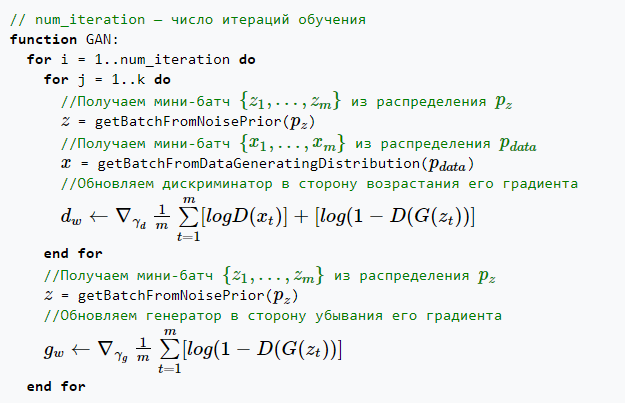

In [14]:
%%time
# списки для логов
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Training...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Шаг дискриминатора: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Сперва реальный батч
        netD.zero_grad()
        real_batch = data[0].to(device)
        b_size = real_batch.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward и backward по реальному батчу
        output = netD(real_batch).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item() #средним ответ дискриминатора на реальных данных

        ## Теперь фейковый батч
        # генерим батч шума и получаем выход генератора на нём
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake_batch = netG(noise)
        label.fill_(fake_label)

        # Forward и backward по фейковому батчу
        output = netD(fake_batch.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        #собираем все градиенты и делаем шаг
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Шаг генератора: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # тонкий момент: фейковые лейблы в терминах генератора - реальные
        
        # мы обновили D, прогоним через одновленную сеть фейки ещё раз
        output = netD(fake_batch).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item() #смотрим как изменилось на том же фейке поведение дискриминатора
        optimizerG.step()

        # просто логи
        if i % 100 == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f  D(x): %.4f D(G(z)): %.4f -> %.4f'
                  % (epoch+1, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # сохраняем лоссы для будущего графика
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # сохраняем результаты на фиксированном входе генератора
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Training...
[1/2][0/1583] Loss_D: 1.6690 Loss_G: 2.5866  D(x): 0.4913 D(G(z)): 0.5185 -> 0.0957
[1/2][100/1583] Loss_D: 0.6069 Loss_G: 7.9119  D(x): 0.9081 D(G(z)): 0.3275 -> 0.0009
[1/2][200/1583] Loss_D: 0.5335 Loss_G: 2.7629  D(x): 0.8479 D(G(z)): 0.2694 -> 0.0858
[1/2][300/1583] Loss_D: 0.4930 Loss_G: 4.0544  D(x): 0.8560 D(G(z)): 0.2496 -> 0.0327
[1/2][400/1583] Loss_D: 0.4158 Loss_G: 3.7431  D(x): 0.7550 D(G(z)): 0.0666 -> 0.0411
[1/2][500/1583] Loss_D: 1.0646 Loss_G: 5.2081  D(x): 0.9179 D(G(z)): 0.5604 -> 0.0125
[1/2][600/1583] Loss_D: 0.5641 Loss_G: 3.6529  D(x): 0.8663 D(G(z)): 0.2949 -> 0.0387
[1/2][700/1583] Loss_D: 0.3826 Loss_G: 3.0878  D(x): 0.8360 D(G(z)): 0.1510 -> 0.0716
[1/2][800/1583] Loss_D: 0.4418 Loss_G: 3.3296  D(x): 0.8525 D(G(z)): 0.2111 -> 0.0532
[1/2][900/1583] Loss_D: 0.7572 Loss_G: 1.7889  D(x): 0.5857 D(G(z)): 0.0923 -> 0.2175
[1/2][1000/1583] Loss_D: 1.4823 Loss_G: 1.0982  D(x): 0.3330 D(G(z)): 0.0755 -> 0.3989
[1/2][1100/1583] Loss_D: 0.7110 Loss_G: 3.8

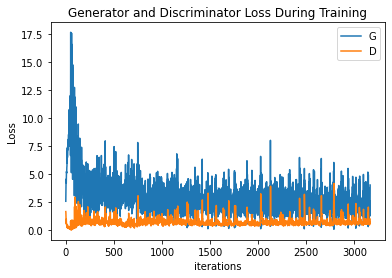

In [15]:
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

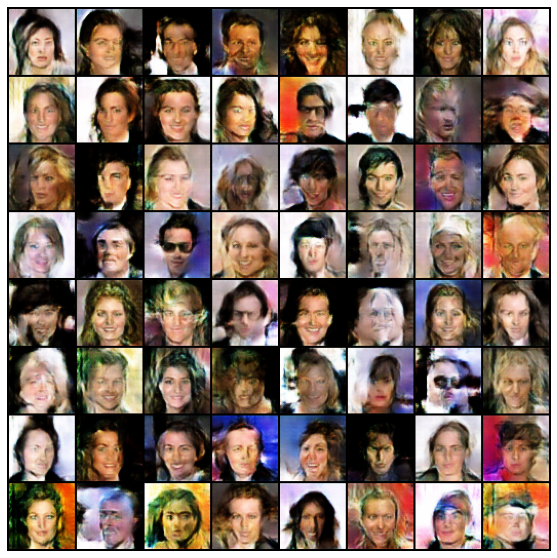

In [18]:
fig = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, blit=True)

HTML(ani.to_jshtml())

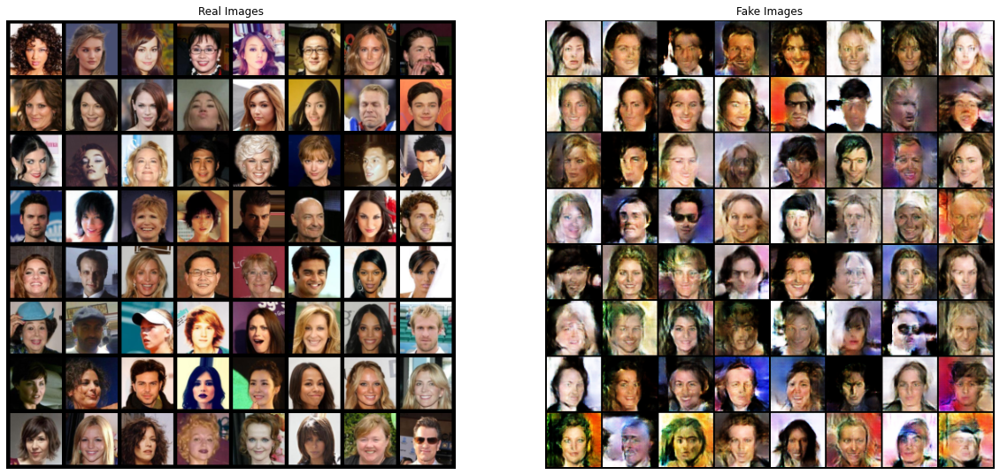

In [17]:
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(20, 20))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

## **14.4** Добавим контроля

Можем ли мы как то влиять на то что будет получено на выходе GANa? Конечно, для этого есть conditional GAN. 

Архитеутерно в нем есть всё то же самое - генератор и дискриминатор, которые занимаются тем же что и раньше. Разница в том, что получают они на вход. 

Раньше $G$ получал шум $x$, а $D$ какой-то $x$, который мог оказаться реальным или фейком. Теперь же оба они ещё получают какую то дополнительную информацию (ещё вектор) - условие. Например, если мы генерим цифры, в качестве условия можно подавать прямо эту цифру (one-hot encoded вариант).

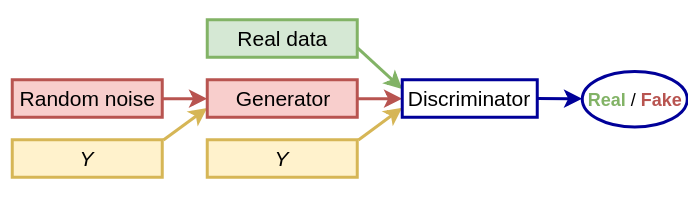

Вот и весь фокус, осталось только в архитектуры приплести обработку этого условия. Простая [статья](https://medium.com/datadriveninvestor/an-introduction-to-conditional-gans-cgans-727d1f5bb011) для понимания. 

**Какие ещё варианты условий?**

Это может быть буквально картинка, которую мы хотим как то изменить с помощью генератора: раскрасить, нарисовать по границам, и тд. Такой метод работы попиксельно с сходом называется [pix2pix](https://arxiv.org/pdf/1611.07004.pdf), генератор в данном случае тоже будет типа encoder-decoder, так как стартует с условной картинки. С этими штуками вам предстоит поработать дома.

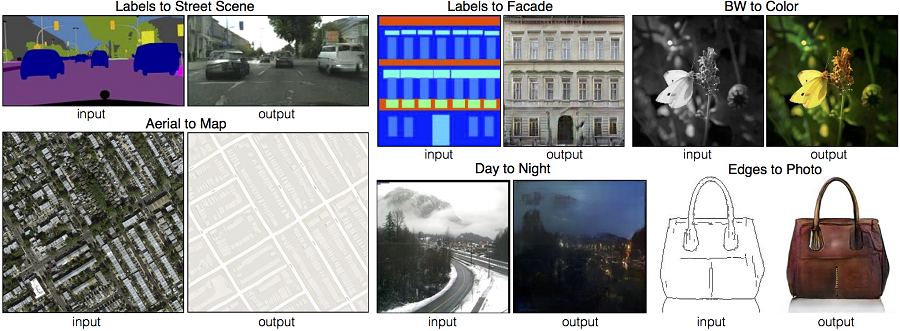

## **14.5** Немножко потыкаем в репозиторий

А что если у нас нет пар изображений, а есть просто две группы изображений, между которыми мы хотим провести трансляцию. Без проблем, для этого есть CycleGAN.

Здесь мы уже будем учить два генератора: $A$ -> $B$, $B$->$A$ и два дискриминатора. 

И что тут теперь будет в loss входить? Во-первых, знакомые нам части про соревнование генератор-дискриминатор + reconstruction loss - L1 норма на $x$ и $\hat x$

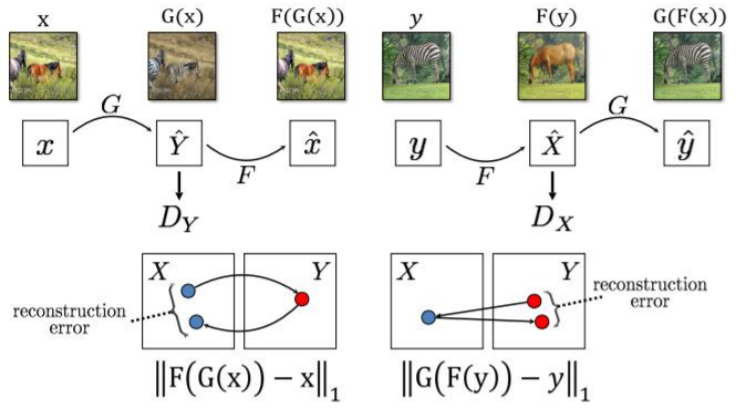

Тут будем использовать суперизвестный репозиторий [pytorch-CycleGAN-and-pix2pix](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix).

In [19]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix 

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2503, done.
remote: Total 2503 (delta 0), reused 0 (delta 0), pack-reused 2503
Receiving objects: 100% (2503/2503), 8.19 MiB | 4.58 MiB/s, done.
Resolving deltas: 100% (1570/1570), done.


In [20]:
os.chdir('pytorch-CycleGAN-and-pix2pix/')

In [21]:
!pip install -r requirements.txt > log

In [22]:
#!bash ./datasets/download_cyclegan_dataset.sh horse2zebra > log_data

for details.

--2022-12-16 16:06:13--  http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/horse2zebra.zip
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116867962 (111M) [application/zip]
Saving to: ‘./datasets/horse2zebra.zip’

./datasets/horse2ze 100%[===================>] 111,45M   688KB/s    in 4m 7s   

2022-12-16 16:10:21 (462 KB/s) - ‘./datasets/horse2zebra.zip’ saved [116867962/116867962]



In [23]:
#!bash ./scripts/download_cyclegan_model.sh horse2zebra

Note: available models are apple2orange, orange2apple, summer2winter_yosemite, winter2summer_yosemite, horse2zebra, zebra2horse, monet2photo, style_monet, style_cezanne, style_ukiyoe, style_vangogh, sat2map, map2sat, cityscapes_photo2label, cityscapes_label2photo, facades_photo2label, facades_label2photo, iphone2dslr_flower
Specified [horse2zebra]
for details.

--2022-12-16 16:10:23--  http://efrosgans.eecs.berkeley.edu/cyclegan/pretrained_models/horse2zebra.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 45575747 (43M)
Saving to: ‘./checkpoints/horse2zebra_pretrained/latest_net_G.pth’

./checkpoints/horse 100%[===================>]  43,46M  3,04MB/s    in 64s     

2022-12-16 16:11:27 (693 KB/s) - ‘./checkpoints/horse2zebra_pretrained/latest_net_G.pth’ saved [45575747/45575747]



In [24]:
os.listdir('./checkpoints/horse2zebra_pretrained/')

['latest_net_G.pth']

In [25]:
os.mkdir('./datasets/my/')
os.mkdir('./datasets/my/TestA/')

In [29]:
#!cp '/content/drive/MyDrive/Colab Notebooks/OM 2021/14. GAN/content.jpeg' ./datasets/my/TestA/
!cp "/home/sergey/My_projects/AIMasters_2022/ai-masters-ml3-seminars/14_gan/content.jpeg" ./datasets/my/TestA/

In [30]:
!python test.py --dataroot ./datasets/my/ --name horse2zebra_pretrained --num_test 1 --model test --no_dropout

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/my/                	[default: None]
             dataset_mode: single                        
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                            

In [31]:
os.listdir('results/horse2zebra_pretrained/test_latest/images')

['content_fake.png', 'content_real.png']

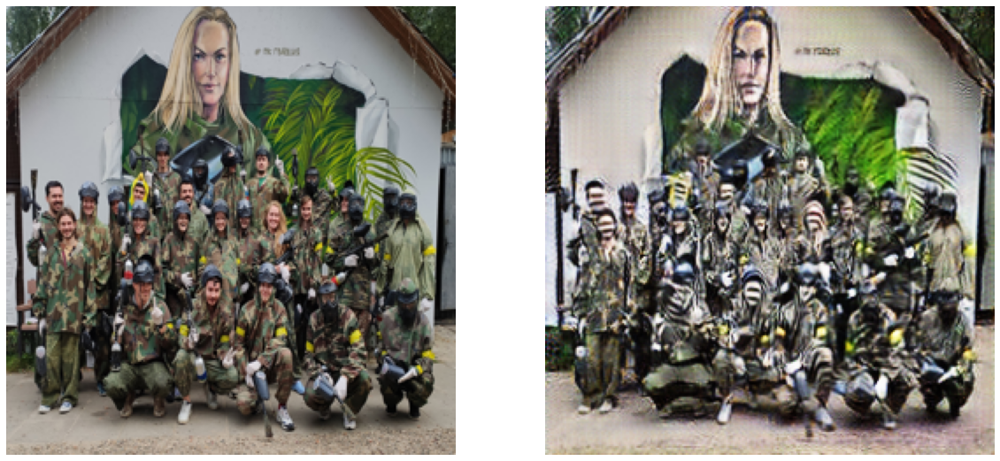

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))
img = plt.imread('results/horse2zebra_pretrained/test_latest/images/content_real.png')
ax[0].imshow(img)
ax[0].axis('off')
img = plt.imread('results/horse2zebra_pretrained/test_latest/images/content_fake.png')
ax[1].imshow(img)
ax[1].axis('off')
plt.imshow(img)

## **14.6** Take-home things

1. Попробуйте поучить подольше DCGAN, станет ли лучше?
2. Посмотрите, как на результат влияют размеры изображений, на которых учимся, и внутренние размерности $G$, $D$
3. Если что то было непонятно, [вот](http://neerc.ifmo.ru/wiki/index.php?title=Generative_Adversarial_Nets_(GAN)) довольно прозрачное объяснение на русском
4. Хороший базовый overview по GAN моделям от Goodfellow почитать [тут](https://arxiv.org/pdf/1701.00160.pdf). 
5. А современный и объемный навигатор по GAN моделям [тут](https://github.com/nashory/gans-awesome-applications)
6. Впереди простая и приятная домашняя работа по pix2pix (conditional GAN)

**GL, HF**